In [2]:
from tensorflow.python.ops.gen_nn_ops import depthwise_conv2d_native
#!/usr/bin/env python3
#
# Team members' IDs:
# 182a3da8-8a9e-11ec-986f-f39926f24a9c  (Jan Zubáč)
# 7797f596-9326-11ec-986f-f39926f24a9c
# 449dba85-9adb-11ec-986f-f39926f24a9c
#
import argparse
import datetime
import os
import re
import time
os.environ.setdefault("TF_CPP_MIN_LOG_LEVEL", "2")  # Report only TF errors by default

import numpy as np
import tensorflow as tf

import matplotlib.pyplot as plt
import matplotlib

from cags_dataset import CAGS
import efficient_net




def main(args: argparse.Namespace) -> None:

    # Fix random seeds and threads
    tf.keras.utils.set_random_seed(args.seed)
    tf.config.threading.set_inter_op_parallelism_threads(args.threads)
    tf.config.threading.set_intra_op_parallelism_threads(args.threads)

    # Create logdir name
    args.logdir = os.path.join("logs", "{}-{}-{}".format(
        os.path.basename(globals().get("__file__", "notebook")),
        datetime.datetime.now().strftime("%Y-%m-%d_%H%M%S"),
        ",".join(("{}={}".format(re.sub("(.)[^_]*_?", r"\1", k), v) for k, v in sorted(vars(args).items())))
    ))

    # Load the data
    cags = CAGS()

    generator = tf.random.Generator.from_seed(args.seed)
    def train_augment(image: tf.Tensor, label: tf.Tensor): # -> Tuple[tf.Tensor, tf.Tensor]:
        if generator.uniform([]) >= 0.5:
            image = tf.image.flip_left_right(image)
        image = tf.image.resize_with_crop_or_pad(image, CAGS.H + 6, CAGS.W + 6)
        image = tf.image.resize(image, [generator.uniform([], CAGS.H, CAGS.H + 12 + 1, dtype=tf.int32),
                                        generator.uniform([], CAGS.W, CAGS.W + 12 + 1, dtype=tf.int32)])
        image = tf.image.crop_to_bounding_box(
            image, target_height=CAGS.H, target_width=CAGS.W,
            offset_height=generator.uniform([], maxval=tf.shape(image)[0] - CAGS.H + 1, dtype=tf.int32),
            offset_width=generator.uniform([], maxval=tf.shape(image)[1] - CAGS.W + 1, dtype=tf.int32),
        )
        return image, label

    # Load the EfficientNet-B0 model
    efficientnet_b0 = efficient_net.pretrained_efficientnet_b0(include_top=False)

    # TODO: Create the model and train it
    # building model layers
    inputs = tf.keras.layers.Input(shape=[CAGS.H, CAGS.W, CAGS.C])
    hidden  = efficientnet_b0(inputs, training=True)
    out_eff_net, c5, c4, c3, c2, c1  = hidden

    hidden = tf.keras.layers.Flatten()(out_eff_net)
    
    for hidden_layer_size in args.hidden_layers:
        hidden =  tf.keras.layers.Dense(hidden_layer_size, activation=tf.nn.relu) (hidden)
        hidden = tf.keras.layers.Dropout(args.dropout) (hidden)


    
    outputs = tf.keras.layers.Dense(len(CAGS.LABELS), activation=tf.nn.softmax)(hidden)

    # choosing lr
    learning_rate = tf.keras.optimizers.schedules.PolynomialDecay(  args.learning_rate, args.decay_steps, 
                                                                    end_learning_rate=args.learning_rate_final, power=1.0,
                                                                    cycle=False, name='linear_lr_decay')

    # choosing optimizer
    if args.optimizer=='SGD':
        if args.momentum != None:
            momentum = args.momentum
        else:
            momentum = 0.0
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=momentum, nesterov=False, name='SGD')

    if args.optimizer=='Adam':
        optimizer =  tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False, name='Adam')


    # compile model
    model =  tf.keras.Model(inputs=inputs, outputs=outputs)
    model.compile(
        optimizer=optimizer,
        loss=tf.losses.SparseCategoricalCrossentropy(),
        metrics=[tf.metrics.SparseCategoricalAccuracy("accuracy")],
        )
    
    # fit
    tb_callback = tf.keras.callbacks.TensorBoard(args.logdir, update_freq=100, profile_batch=0)

    train = cags.train.map(lambda example: (example["image"], example["label"]))
    train = train.map(train_augment)
    train = train.shuffle(10000, seed=args.seed)
    train = train.batch(args.batch_size)

    dev = cags.dev.map(lambda example: (example["image"], example["label"]))
    # dev = dev.shuffle(10000, seed=args.seed)
    dev = dev.batch(args.batch_size)

    logs = model.fit(
            train,
            batch_size=args.batch_size, epochs=args.epochs,
            validation_data=dev,
            callbacks=[tb_callback]
        )
    
    os.makedirs(args.logdir, exist_ok=True)
    with open(os.path.join(args.logdir, "cags_classification_dev.txt"), "w", encoding="utf-8") as predictions_file:
        # TODO: Predict the probabilities on the test set
        dev_probabilities = model.predict(dev)

        for probs in dev_probabilities:
            print(np.argmax(probs), file=predictions_file)

    def plot_example(model, dataset, ind=4, plot_color=False, title="dataset"):
        #ind = np.ceil(np.sqrt(len(dataset)))
        
        fig = plt.figure(figsize=(ind*3.5, ind*3.5))
        # plt.clf()
        gs = matplotlib.gridspec.GridSpec(nrows=ind, ncols=ind)
        fig.suptitle(title, y=1.02)

        dataset = dataset.shuffle(ind**2, seed=np.random.randint(100))
        dataset_example = dataset.take(ind**2)
    
        predictions_example = model.predict(dataset_example)
        
        for i, (example, pred) in enumerate(zip(dataset_example, predictions_example)):
            ax = fig.add_subplot(gs[i])
            ax.axis('off')
            ax.imshow(example[0][0])
            predicted = tf.argmax(pred)
            if plot_color:
                if predicted == example[1][0]:
                  color = 'green'
                else:
                  color = 'red'
            else:
              color = 'black'
            ax.set_title('{}'.format(cags.LABELS[predicted]), color = color)
            
        plt.tight_layout()
        fig.show()

    
    # # # Generate test set annotations, but in `args.logdir` to allow parallel execution.
    os.makedirs(args.logdir, exist_ok=True)
    with open(os.path.join(args.logdir, "cags_classification.txt"), "w", encoding="utf-8") as predictions_file:
        # TODO: Predict the probabilities on the test set
        test = cags.test.map(lambda example: (example["image"], example["label"]))
        # test = test.shuffle(10000, seed=args.seed)
        test = test.batch(args.batch_size)
        test_probabilities = model.predict(test)

        for probs in test_probabilities:
            print(np.argmax(probs), file=predictions_file)
  

In [ ]:
 # test
 # time.sleep(360)

In [59]:
# TODO: Define reasonable defaults and optionally more parameters
parser = argparse.ArgumentParser()
parser.add_argument("--batch_size", default=16, type=int, help="Batch size.")
parser.add_argument("--epochs", default=1, type=int, help="Number of epochs.")
parser.add_argument("--seed", default=42, type=int, help="Random seed.")

parser.add_argument("--threads", default=4, type=int, help="Maximum number of threads to use.")
##
parser.add_argument("--window", default=8, type=int, help="Window size to use.")
parser.add_argument("--l2", default=0.0, type=float, help="L2 regularization.")
parser.add_argument("--hidden_layers", default=[50,20], nargs="*", type=int, help="Hidden layer sizes.")
parser.add_argument("--dropout", default=0.2, type=float, help="Dropout regularization.")
parser.add_argument("--decay_steps", default=100, type=int, help="decay_steps.")
parser.add_argument("--learning_rate", default=0.001, type=float, help="Initial learning rate.")
parser.add_argument("--learning_rate_final", default=0.001, type=float, help="Final learning rate.")
parser.add_argument("--momentum", default=0.85, type=float, help="Momentum.")
parser.add_argument("--optimizer", default="SGD", type=str, help="Optimizer to use.")
args = parser.parse_args([] if "__file__" not in globals() else None)
print(args)
main(args)

Namespace(batch_size=16, decay_steps=100, dropout=0.2, epochs=1, hidden_layers=[50, 20], l2=0.0, learning_rate=0.001, learning_rate_final=0.001, momentum=0.85, optimizer='SGD', seed=42, threads=4, window=8)
134/134 [==============================] - 34s 140ms/step - loss: 3.5262 - accuracy: 0.0387 - val_loss: 3.5038 - val_accuracy: 0.0490


In [ ]:
# TODO: Define reasonable defaults and optionally more parameters
parser = argparse.ArgumentParser()
parser.add_argument("--batch_size", default=1, type=int, help="Batch size.")
parser.add_argument("--epochs", default=10, type=int, help="Number of epochs.")
parser.add_argument("--seed", default=42, type=int, help="Random seed.")
parser.add_argument("--threads", default=4, type=int, help="Maximum number of threads to use.")
##
parser.add_argument("--window", default=8, type=int, help="Window size to use.")
parser.add_argument("--l2", default=0.0, type=float, help="L2 regularization.")
parser.add_argument("--hidden_layers", default=[100,100], nargs="*", type=int, help="Hidden layer sizes.")
parser.add_argument("--dropout", default=0.4, type=float, help="Dropout regularization.")
parser.add_argument("--decay_steps", default=100, type=int, help="decay_steps.")
parser.add_argument("--learning_rate", default=0.01, type=float, help="Initial learning rate.")
parser.add_argument("--learning_rate_final", default=0.001, type=float, help="Final learning rate.")
parser.add_argument("--momentum", default=0.85, type=float, help="Momentum.")
parser.add_argument("--optimizer", default="SGD", type=str, help="Optimizer to use.")
args = parser.parse_args([] if "__file__" not in globals() else None)
print(args)
main(args)

In [ ]:
import time

In [60]:
# TODO: Define reasonable defaults and optionally more parameters
parser = argparse.ArgumentParser()
parser.add_argument("--batch_size", default=16, type=int, help="Batch size.")
parser.add_argument("--epochs", default=250, type=int, help="Number of epochs.")
parser.add_argument("--seed", default=42, type=int, help="Random seed.")
parser.add_argument("--threads", default=4, type=int, help="Maximum number of threads to use.")
##
parser.add_argument("--window", default=8, type=int, help="Window size to use.")
parser.add_argument("--l2", default=0.0, type=float, help="L2 regularization.")
parser.add_argument("--hidden_layers", default=[100,100], nargs="*", type=int, help="Hidden layer sizes.")
parser.add_argument("--dropout", default=0.5, type=float, help="Dropout regularization.")
parser.add_argument("--decay_steps", default=100, type=int, help="decay_steps.")
parser.add_argument("--learning_rate", default=0.01, type=float, help="Initial learning rate.")
parser.add_argument("--learning_rate_final", default=0.001, type=float, help="Final learning rate.")
parser.add_argument("--momentum", default=0.85, type=float, help="Momentum.")
parser.add_argument("--optimizer", default="SGD", type=str, help="Optimizer to use.")
args = parser.parse_args([] if "__file__" not in globals() else None)
print(args)
main(args)

Namespace(batch_size=16, decay_steps=100, dropout=0.5, epochs=250, hidden_layers=[100, 100], l2=0.0, learning_rate=0.01, learning_rate_final=0.001, momentum=0.85, optimizer='SGD', seed=42, threads=4, window=8)
Epoch 1/250
134/134 [==============================] - 33s 146ms/step - loss: 3.4660 - accuracy: 0.0635 - val_loss: 3.3652 - val_accuracy: 0.2026
Epoch 2/250
134/134 [==============================] - 22s 124ms/step - loss: 3.3686 - accuracy: 0.1102 - val_loss: 3.3000 - val_accuracy: 0.2484
Epoch 3/250
134/134 [==============================] - 21s 124ms/step - loss: 3.2930 - accuracy: 0.1106 - val_loss: 3.2052 - val_accuracy: 0.2974
Epoch 4/250
134/134 [==============================] - 21s 124ms/step - loss: 3.1966 - accuracy: 0.1517 - val_loss: 3.0735 - val_accuracy: 0.3399
Epoch 5/250
134/134 [==============================] - 21s 124ms/step - loss: 3.1054 - accuracy: 0.1718 - val_loss: 2.9170 - val_accuracy: 0.3889
Epoch 6/250
134/134 [==============================] - 21s 1

In [ ]:
time.sleep(36000)

In [5]:
def plot_example_test(predictions, dataset, ind=4, plot_color=False, title="dataset"):
    
    cags = CAGS()
    test_predictions_names = [ cags.LABELS[i] for i in test_predictions]

    fig = plt.figure(figsize=(ind*3.5, ind*3.5))
    gs = matplotlib.gridspec.GridSpec(nrows=ind, ncols=ind)
    fig.suptitle(title, y=1.02)
    
    ind_rnd = np.random.randint(len(predictions), size=ind**2)


    ii = 0
    for i, (example, prediction) in enumerate(zip(dataset, predictions)):
        if ii < ind**2 and i in ind_rnd:
            ax = fig.add_subplot(gs[ii])
            ax.axis('off')
            ax.imshow(example[0][0])
            if plot_color:
                if prediction == example[1][0]:
                  color = 'green'
                else:
                  color = 'red'
            else:
              color = 'black'
            ax.set_title('{}'.format(cags.LABELS[prediction]), color = color)
            ii += 1
        
    plt.tight_layout()
    fig.show()

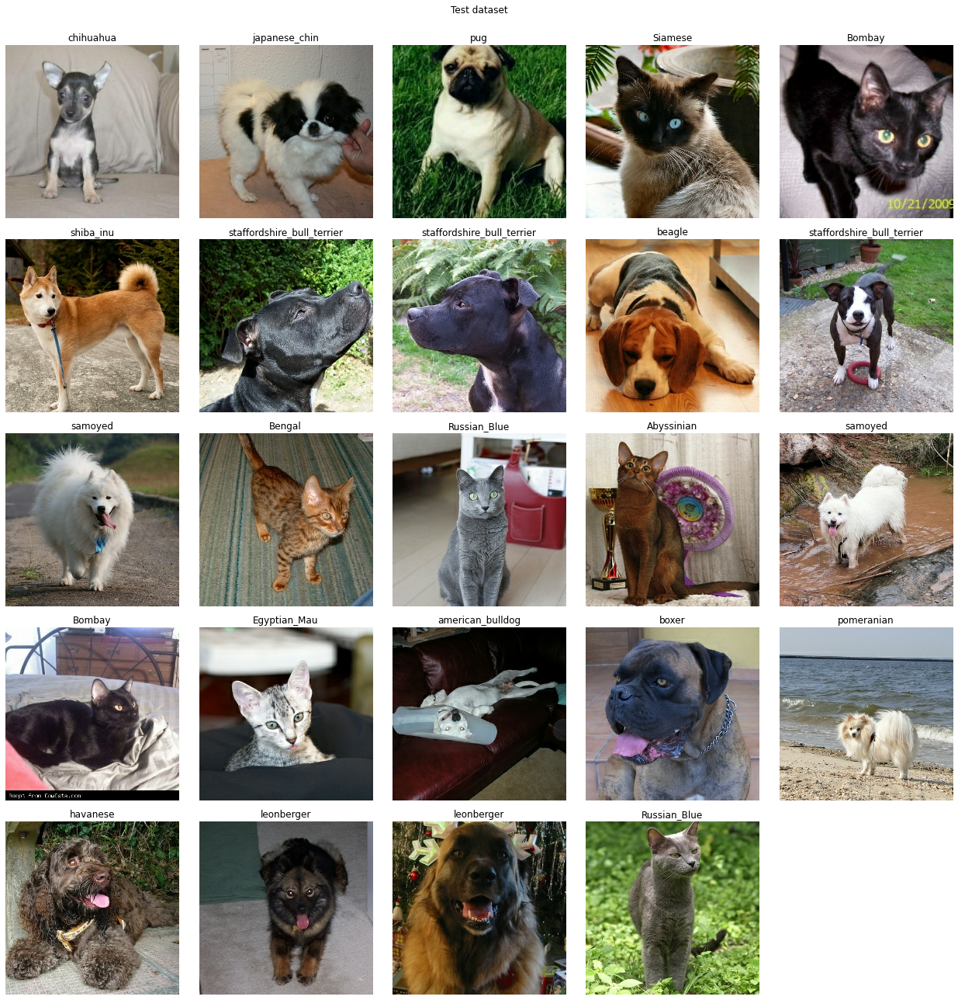

In [6]:
test_predictions = np.loadtxt("cags_classification.txt", dtype ='int')
cags = CAGS()
test = cags.test.map(lambda example: (example["image"], example["label"]))
test = test.batch(1)

plot_example_test(test_predictions, test, ind=5, plot_color=False, title="Test dataset")

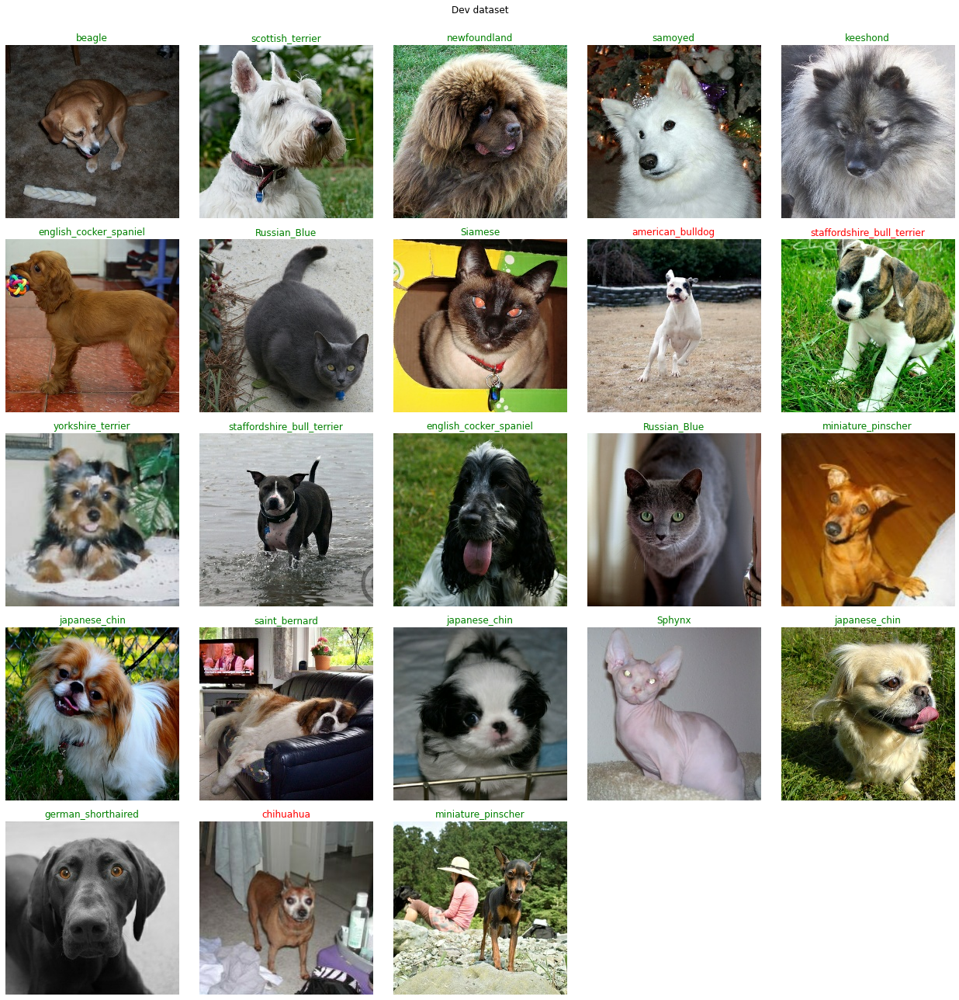

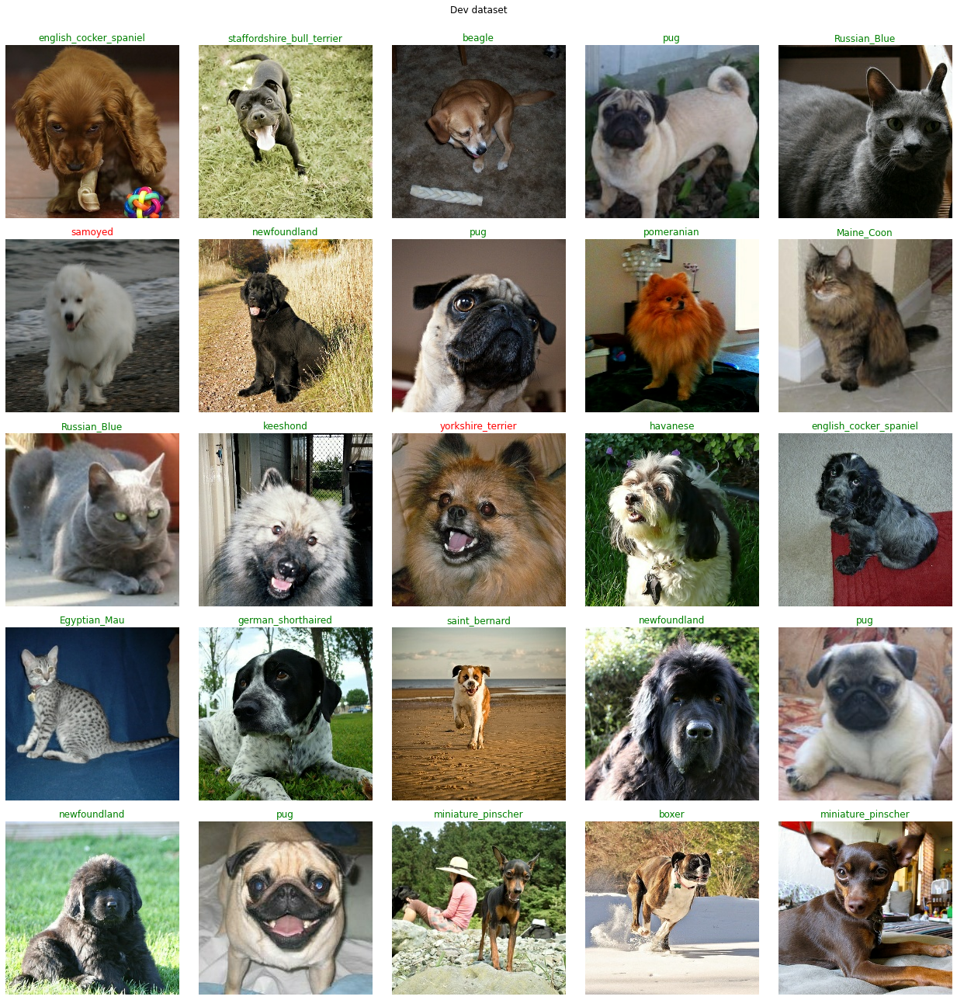

In [ ]:
dev_predictions = np.loadtxt("cags_classification_dev.txt", dtype ='int')
cags = CAGS()
dev = cags.dev.map(lambda example: (example["image"], example["label"]))
dev = dev.batch(1)
# dev = dev.batch(1,  deterministic=True, num_parallel_calls=4)

for _ in range(10):
    plot_example_test(dev_predictions, dev, ind=5, plot_color=True, title="Dev dataset")